In [10]:
#Imports and Global Configuration

import os
import glob
import numpy as np
#import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split

from torchvision import transforms

from skimage.filters import threshold_sauvola, gaussian
from skimage.morphology import (
    remove_small_objects,
    remove_small_holes,
    closing,
    dilation,
    disk
)

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Data path
DATA_DIR = "/lustre/darse/users/4284/rse_resourses/1400"

Using device: cuda


In [11]:
# Final Sauvola settings
# These were selected after visual inspection.

MASK_CONFIG = {
    "window_size": 31,
    "k": -0.2,
    "sigma": 0.3,
    "min_object_size": 80,
    "min_hole_size": 40,
    "closing_radius": 1,
    "dilation_radius": 1,
}

IMAGE_SIZE = 224
PANEL_HEIGHT = 62
BATCH_SIZE = 8
EPOCHS = 20

In [12]:
#Image Preprocessing

def remove_lower_panel(img, panel_height=62):
    """
    Remove the lower instrument/annotation panel from the TIFF image.

    Why:
    The bottom 62 pixels are not part of the real microstructure.
    If we keep them, the model may learn non-material artifacts.
    """

    w, h = img.size

    if h > panel_height:
        img = img.crop((0, 0, w, h - panel_height))

    return img


def center_crop_square(img):
    """
    Center crop image into a square.

    Why:
    Deep learning models work best with fixed square input sizes.
    Center crop avoids stretching the microstructure.
    """

    w, h = img.size
    crop_size = min(w, h)

    left = (w - crop_size) // 2
    top = (h - crop_size) // 2
    right = left + crop_size
    bottom = top + crop_size

    return img.crop((left, top, right, bottom))

In [13]:
#Sauvola Pseudo-Mask Generation

def create_sauvola_mask_final(
    img_tensor,
    window_size=31,
    k=-0.2,
    sigma=0.3,
    min_object_size=80,
    min_hole_size=40,
    closing_radius=1,
    dilation_radius=1
):
    """
    Create a binary pseudo-mask using Sauvola thresholding.

    Input:
        img_tensor: torch.Tensor with shape [3, H, W]

    Output:
        mask: numpy array with shape [H, W]
              foreground = 1
              background = 0

    Important:
        The mask is inverted at the end so that the dark boundary-like
        microstructure regions become foreground.
    """

    #Convert tensor image to NumPy grayscale image
    # The input has 3 repeated grayscale channels.
    # We only need one channel.
    img = img_tensor[0].detach().cpu().numpy()

    #Apply light Gaussian smoothing

    # This reduces tiny pixel-level noise while preserving boundaries.
    img_smooth = gaussian(img, sigma=sigma)

    #Compute local Sauvola threshold map
    #Unlike Otsu, Sauvola computes a local threshold for each region.
    thresh_map = threshold_sauvola(
        img_smooth,
        window_size=window_size,
        k=k
    )

    #Create initial binary mask
    # Since the structures of interest are darker, we select pixels
    # below the local threshold.
    mask = img_smooth < thresh_map

    #Extra intensity filter
    # This prevents bright regions from being selected just because
    # they are locally darker than their neighbors.
    mask = mask & (img_smooth < 0.6)

    # Remove tiny noisy objects
    mask = remove_small_objects(mask, min_size=min_object_size)
    #Fill tiny holes inside detected structures
    mask = remove_small_holes(mask, area_threshold=min_hole_size)

    #Morphological closing
    # Closing connects small gaps in thin boundaries.
    if closing_radius > 0:
        mask = closing(mask, disk(closing_radius))

    #Dilation
    # Dilation slightly thickens the thin structures so the model
    # can learn them more easily.
    if dilation_radius > 0:
        mask = dilation(mask, disk(dilation_radius))
    # Invert mask
    # Before inversion:
    #     1 = background-like region
    #     0 = dark structures
    #
    # After inversion:
    #     1 = dark microstructure boundaries/features
    #     0 = background
    mask = 1 - mask.astype(np.float32)

    return mask.astype(np.float32)

In [14]:
#Dataset: Image + Sauvola Pseudo-Mask

class SauvolaSegmentationDataset(Dataset):
    def __init__(
        self,
        folder,
        image_size=224,
        panel_height=62,
        window_size=31,
        k=-0.2,
        sigma=0.3,
        min_object_size=80,
        min_hole_size=40,
        closing_radius=1,
        dilation_radius=1
    ):
        self.folder = folder
        self.image_size = image_size
        self.panel_height = panel_height

        # Store mask parameters so we can verify reproducibility
        self.window_size = window_size
        self.k = k
        self.sigma = sigma
        self.min_object_size = min_object_size
        self.min_hole_size = min_hole_size
        self.closing_radius = closing_radius
        self.dilation_radius = dilation_radius

        # Recursively find TIFF files
        self.files = sorted(
            glob.glob(os.path.join(folder, "**", "*.tif"), recursive=True) +
            glob.glob(os.path.join(folder, "**", "*.tiff"), recursive=True) +
            glob.glob(os.path.join(folder, "**", "*.TIF"), recursive=True) +
            glob.glob(os.path.join(folder, "**", "*.TIFF"), recursive=True)
        )

        print(f"Found {len(self.files)} TIFF images.")

        if len(self.files) == 0:
            raise ValueError(f"No TIFF images found in: {folder}")

        # Convert image to 3-channel tensor for CNN/U-Net/DINOv2
        self.transform_img = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.Grayscale(num_output_channels=3),
            transforms.ToTensor(),
        ])

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        # Load image
        img = Image.open(self.files[idx]).convert("L")

        # Remove bottom panel
        img = remove_lower_panel(img, panel_height=self.panel_height)

        # Center crop to square
        img = center_crop_square(img)

        # Convert image to tensor [3, 224, 224]
        image = self.transform_img(img)

        # Generate Sauvola pseudo-mask
        mask_np = create_sauvola_mask_final(
            image,
            window_size=self.window_size,
            k=self.k,
            sigma=self.sigma,
            min_object_size=self.min_object_size,
            min_hole_size=self.min_hole_size,
            closing_radius=self.closing_radius,
            dilation_radius=self.dilation_radius
        )

        # Convert mask [H, W] to tensor [1, H, W]
        mask = torch.from_numpy(mask_np).unsqueeze(0).float()

        return image, mask

In [15]:
#Dataset and Dataloaders


seg_dataset = SauvolaSegmentationDataset(
    DATA_DIR,
    image_size=IMAGE_SIZE,
    panel_height=PANEL_HEIGHT,
    **MASK_CONFIG
)

# Check final parameters are correct
print("Using Sauvola mask config:")
print("window_size:", seg_dataset.window_size)
print("k:", seg_dataset.k)
print("sigma:", seg_dataset.sigma)
print("min_object_size:", seg_dataset.min_object_size)
print("min_hole_size:", seg_dataset.min_hole_size)
print("closing_radius:", seg_dataset.closing_radius)
print("dilation_radius:", seg_dataset.dilation_radius)


Found 206 TIFF images.
Using Sauvola mask config:
window_size: 31
k: -0.2
sigma: 0.3
min_object_size: 80
min_hole_size: 40
closing_radius: 1
dilation_radius: 1


In [24]:

#Visualization 
def visualize_predictions(model, loader, device, title="Prediction", num_samples=4, threshold=0.5):
    """
    Show:
        image
        pseudo-mask
        model prediction

    This helps track whether the model is visually learning the mask pattern.
    """

    model.eval()

    images, masks = next(iter(loader))
    images = images.to(device)

    with torch.no_grad():
        logits = model(images)
        probs = torch.sigmoid(logits)
        preds = (probs > threshold).float()

    images = images.cpu()
    masks = masks.cpu()
    preds = preds.cpu()

    plt.figure(figsize=(12, 9))

    for i in range(min(num_samples, images.size(0))):
        img = images[i][0].numpy()
        gt = masks[i][0].numpy()
        pred = preds[i][0].numpy()

        plt.subplot(3, num_samples, i + 1)
        plt.imshow(img, cmap="gray")
        plt.title("Image")
        plt.axis("off")

        plt.subplot(3, num_samples, i + 1 + num_samples)
        plt.imshow(gt, cmap="gray")
        plt.title("Sauvola Mask")
        plt.axis("off")

        plt.subplot(3, num_samples, i + 1 + 2 * num_samples)
        plt.imshow(pred, cmap="gray")
        plt.title(title)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

In [21]:
def visualize_sauvola_process(img_tensor):
    img, img_smooth, thresh_map, mask = create_sauvola_mask_clean(img_tensor)

    plt.figure(figsize=(10,8))

    plt.subplot(2,2,1)
    plt.imshow(img, cmap="gray")
    plt.title("Original")

    plt.subplot(2,2,2)
    plt.imshow(img_smooth, cmap="gray")
    plt.title("Smoothed")

    plt.subplot(2,2,3)
    plt.imshow(thresh_map, cmap="jet")
    plt.title("Threshold Map")

    plt.subplot(2,2,4)
    plt.imshow(mask, cmap="gray")
    plt.title("Mask")

    plt.tight_layout()

    # safest option
    plt.savefig("sauvola_debug.png", dpi=150)
    print("Saved as sauvola_debug.png")

In [34]:
from torch.utils.data import DataLoader, random_split
import torch

BATCH_SIZE = 8

train_size = int(0.8 * len(seg_dataset))
val_size = len(seg_dataset) - train_size

train_dataset, val_dataset = random_split(
    seg_dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False
)

print("Train samples:", len(train_dataset))
print("Val samples:", len(val_dataset))

images, masks = next(iter(train_loader))
print("Train image batch:", images.shape)
print("Train mask batch:", masks.shape)

Train samples: 164
Val samples: 42
Train image batch: torch.Size([8, 3, 224, 224])
Train mask batch: torch.Size([8, 1, 224, 224])


In [35]:

#Model 1: Basic CNN

class BasicSegCNN(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),   # 224 -> 112

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),   # 112 -> 56

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),   # 56 -> 28
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2),  # 28 -> 56
            nn.ReLU(),

            nn.ConvTranspose2d(32, 16, kernel_size=2, stride=2),  # 56 -> 112
            nn.ReLU(),

            nn.ConvTranspose2d(16, 8, kernel_size=2, stride=2),   # 112 -> 224
            nn.ReLU(),

            nn.Conv2d(8, 1, kernel_size=1)
        )

    def forward(self, x):
        return self.decoder(self.encoder(x))

In [36]:

# U-Net

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.block(x)


class UNetSmall(nn.Module):
    def __init__(self):
        super().__init__()

        self.enc1 = DoubleConv(3, 32)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = DoubleConv(32, 64)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = DoubleConv(64, 128)
        self.pool3 = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(128, 256)

        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(256, 128)

        self.up2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(128, 64)

        self.up1 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(64, 32)

        self.out = nn.Conv2d(32, 1, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        b = self.bottleneck(p3)

        u3 = self.up3(b)
        u3 = torch.cat([u3, e3], dim=1)
        d3 = self.dec3(u3)

        u2 = self.up2(d3)
        u2 = torch.cat([u2, e2], dim=1)
        d2 = self.dec2(u2)

        u1 = self.up1(d2)
        u1 = torch.cat([u1, e1], dim=1)
        d1 = self.dec1(u1)

        return self.out(d1)

In [37]:
# Load frozen DINOv2
dino = torch.hub.load("facebookresearch/dinov2", "dinov2_vits14")
dino = dino.to(device)
dino.eval()

Using cache found in /tmp/torch/hub/facebookresearch_dinov2_main


DinoVisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 384, kernel_size=(14, 14), stride=(14, 14))
    (norm): Identity()
  )
  (blocks): ModuleList(
    (0-11): 12 x NestedTensorBlock(
      (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (attn): MemEffAttention(
        (qkv): Linear(in_features=384, out_features=1152, bias=True)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (drop_path1): Identity()
      (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
      (ls2): LayerScale()
      (drop_path2): Identity()
    )
  )
  (norm): LayerNorm((384,), eps=1e-06, elementwise_affi

In [38]:

#Model 3: DINOv2 + Decoder



for param in dino.parameters():
    param.requires_grad = False


class DINOv2SegmentationModel(nn.Module):
    def __init__(self, dino_model, dino_dim=384):
        super().__init__()

        self.dino = dino_model

        self.proj = nn.Sequential(
            nn.Linear(dino_dim, 256 * 7 * 7),
            nn.ReLU()
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),  # 7 -> 14
            nn.ReLU(),

            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),   # 14 -> 28
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2),    # 28 -> 56
            nn.ReLU(),

            nn.ConvTranspose2d(32, 16, kernel_size=2, stride=2),    # 56 -> 112
            nn.ReLU(),

            nn.ConvTranspose2d(16, 8, kernel_size=2, stride=2),     # 112 -> 224
            nn.ReLU(),

            nn.Conv2d(8, 1, kernel_size=1)
        )

    def forward(self, x):
        with torch.no_grad():
            feat = self.dino(x)  # [B, 384]

        x = self.proj(feat)
        x = x.view(-1, 256, 7, 7)

        return self.decoder(x)

In [39]:

# General Training Function


def train_model(
    model,
    train_loader,
    val_loader,
    device,
    model_name="model",
    epochs=20,
    lr=1e-3,
    visualize_every=2
):
    """
    Train any segmentation model using BCEWithLogitsLoss.

    Uses pos_weight because foreground pixels are sparse.
    """

    model = model.to(device)

    # Estimate class imbalance from one batch
    _, sample_masks = next(iter(train_loader))
    foreground = sample_masks.mean().item()

    pos_weight_value = (1 - foreground) / foreground
    pos_weight = torch.tensor([pos_weight_value], device=device)

    print(f"{model_name} foreground percentage:", foreground)
    print(f"{model_name} pos_weight:", pos_weight_value)

    criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    train_losses = []
    val_losses = []
    best_val_loss = float("inf")

    for epoch in range(epochs):
        model.train()
        total_train_loss = 0

        for images, masks in train_loader:
            images = images.to(device)
            masks = masks.to(device)

            logits = model(images)
            loss = criterion(logits, masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        model.eval()
        total_val_loss = 0

        with torch.no_grad():
            for images, masks in val_loader:
                images = images.to(device)
                masks = masks.to(device)

                logits = model(images)
                loss = criterion(logits, masks)

                total_val_loss += loss.item()

        avg_val_loss = total_val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(
            f"{model_name} | Epoch {epoch+1}/{epochs} | "
            f"Train Loss: {avg_train_loss:.4f} | "
            f"Val Loss: {avg_val_loss:.4f}"
        )

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), f"best_{model_name}.pth")
            print(f"Saved best {model_name}")

        if visualize_every is not None and (epoch + 1) % visualize_every == 0:
            visualize_predictions(model, val_loader, device, title=f"{model_name} Pred")

    return model, train_losses, val_losses

basic_cnn_sauvola_1400 foreground percentage: 0.039368920028209686
basic_cnn_sauvola_1400 pos_weight: 24.400747576602377
basic_cnn_sauvola_1400 | Epoch 1/20 | Train Loss: 1.3311 | Val Loss: 1.3032
Saved best basic_cnn_sauvola_1400
basic_cnn_sauvola_1400 | Epoch 2/20 | Train Loss: 1.3239 | Val Loss: 1.2955
Saved best basic_cnn_sauvola_1400


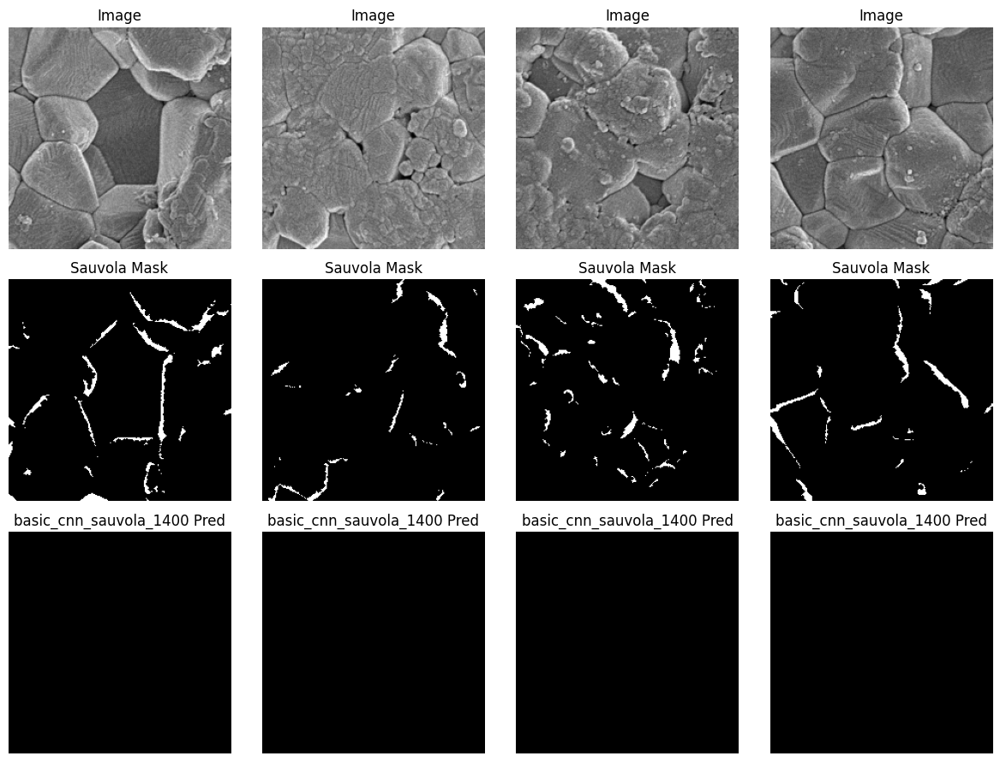

basic_cnn_sauvola_1400 | Epoch 3/20 | Train Loss: 1.2959 | Val Loss: 1.2464
Saved best basic_cnn_sauvola_1400
basic_cnn_sauvola_1400 | Epoch 4/20 | Train Loss: 1.1390 | Val Loss: 0.9005
Saved best basic_cnn_sauvola_1400


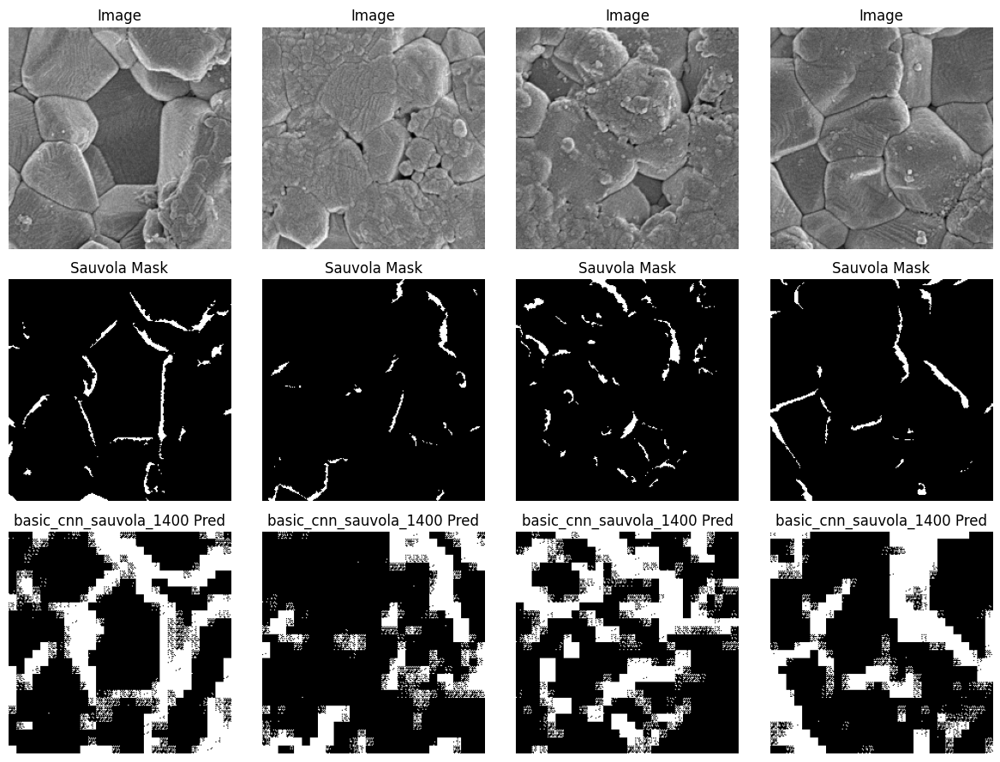

basic_cnn_sauvola_1400 | Epoch 5/20 | Train Loss: 0.8138 | Val Loss: 0.7526
Saved best basic_cnn_sauvola_1400
basic_cnn_sauvola_1400 | Epoch 6/20 | Train Loss: 0.6966 | Val Loss: 0.5982
Saved best basic_cnn_sauvola_1400


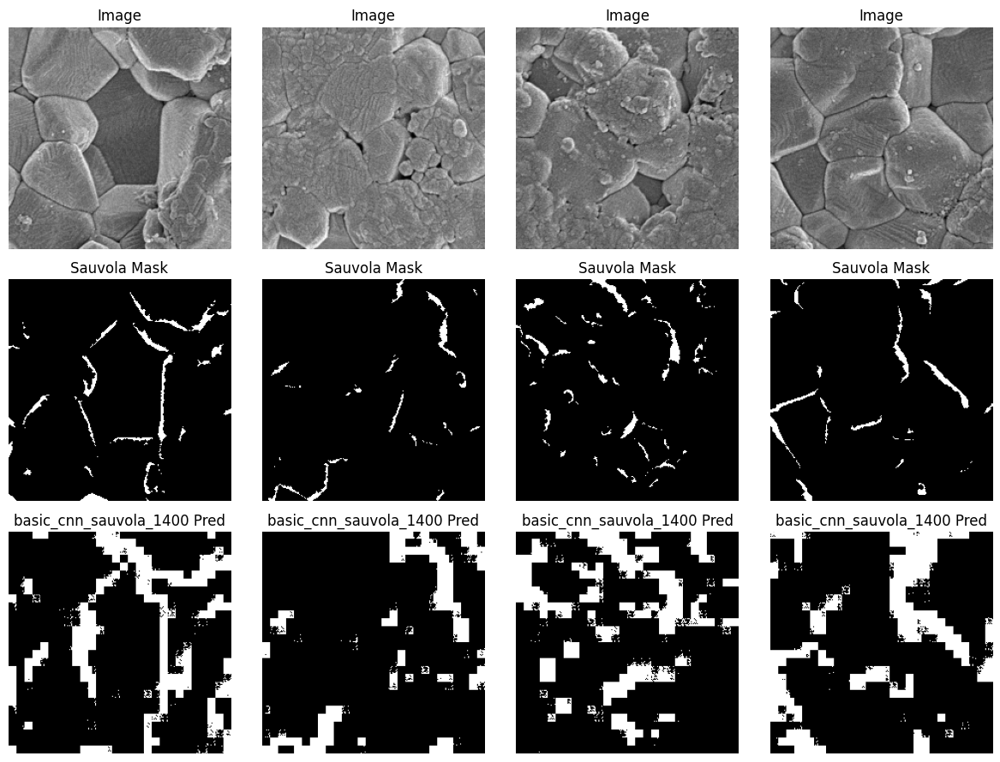

basic_cnn_sauvola_1400 | Epoch 7/20 | Train Loss: 0.6198 | Val Loss: 0.5747
Saved best basic_cnn_sauvola_1400
basic_cnn_sauvola_1400 | Epoch 8/20 | Train Loss: 0.6478 | Val Loss: 0.6415


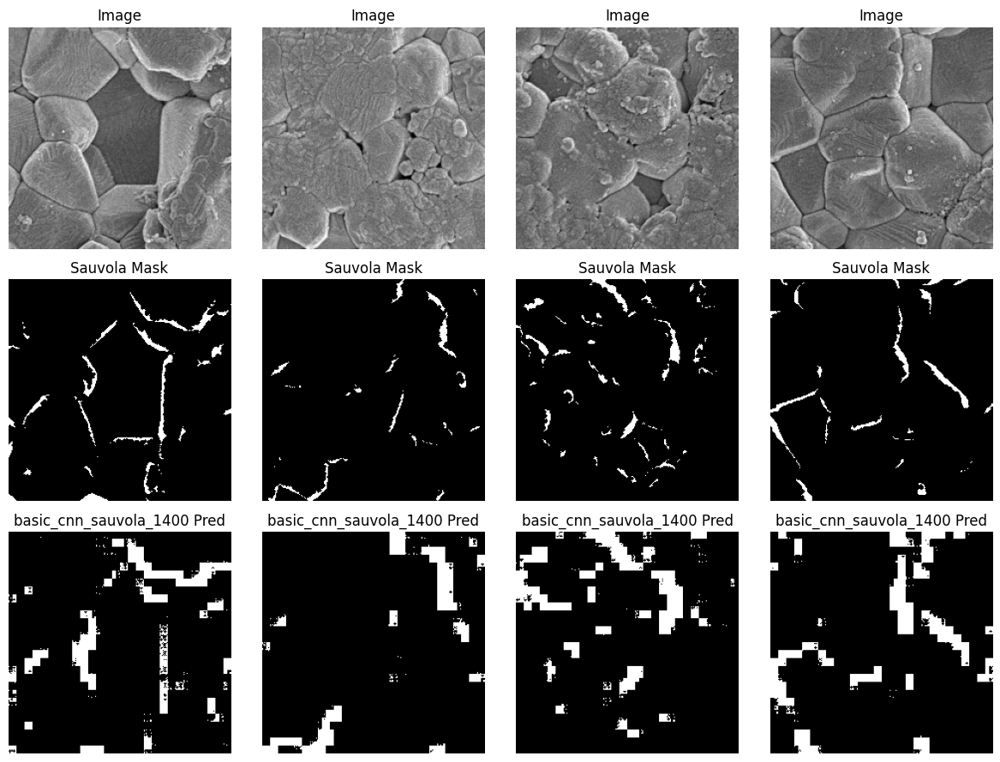

basic_cnn_sauvola_1400 | Epoch 9/20 | Train Loss: 0.6323 | Val Loss: 0.5738
Saved best basic_cnn_sauvola_1400
basic_cnn_sauvola_1400 | Epoch 10/20 | Train Loss: 0.5821 | Val Loss: 0.5224
Saved best basic_cnn_sauvola_1400


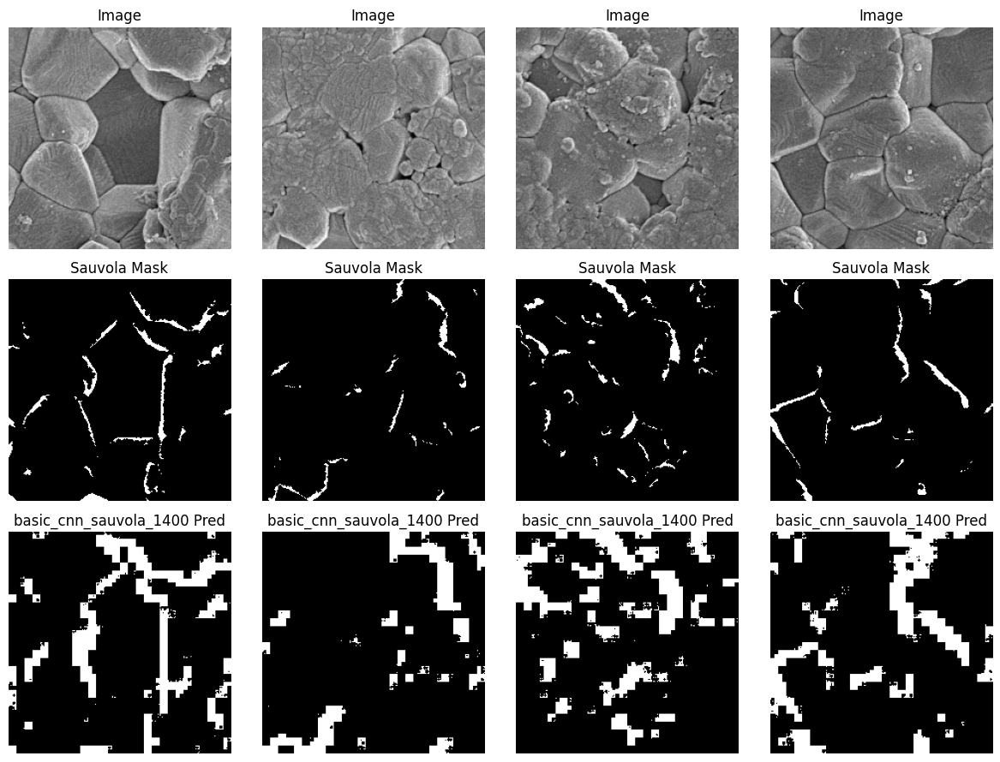

basic_cnn_sauvola_1400 | Epoch 11/20 | Train Loss: 0.5406 | Val Loss: 0.5399
basic_cnn_sauvola_1400 | Epoch 12/20 | Train Loss: 0.5632 | Val Loss: 0.4999
Saved best basic_cnn_sauvola_1400


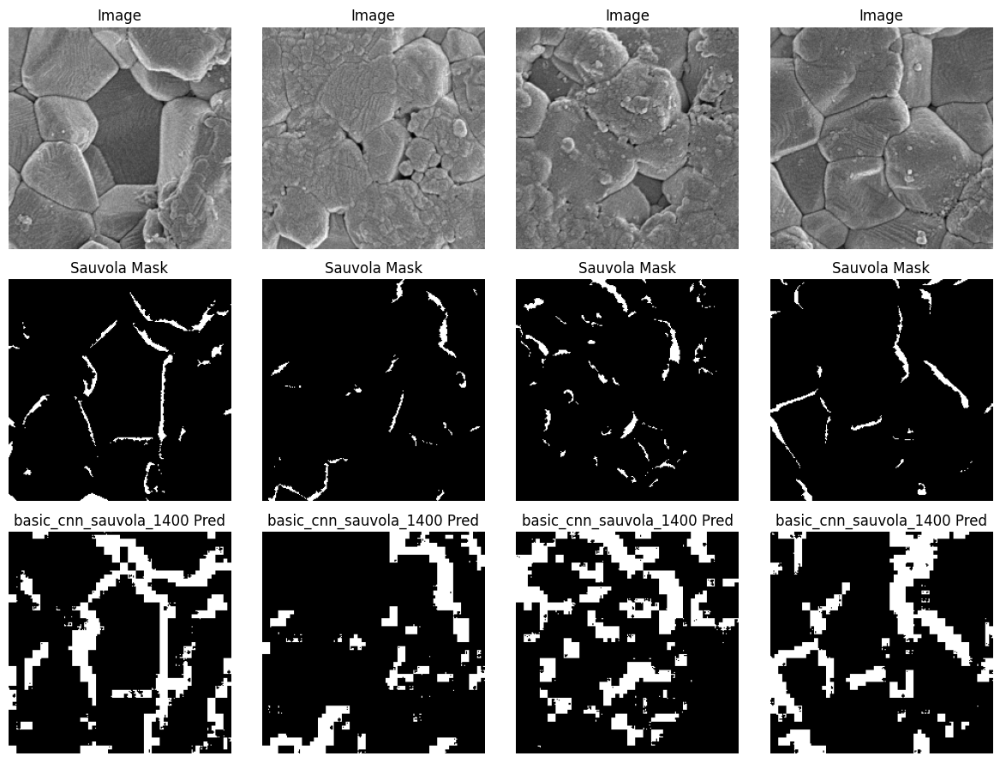

basic_cnn_sauvola_1400 | Epoch 13/20 | Train Loss: 0.5448 | Val Loss: 0.5058
basic_cnn_sauvola_1400 | Epoch 14/20 | Train Loss: 0.5237 | Val Loss: 0.4683
Saved best basic_cnn_sauvola_1400


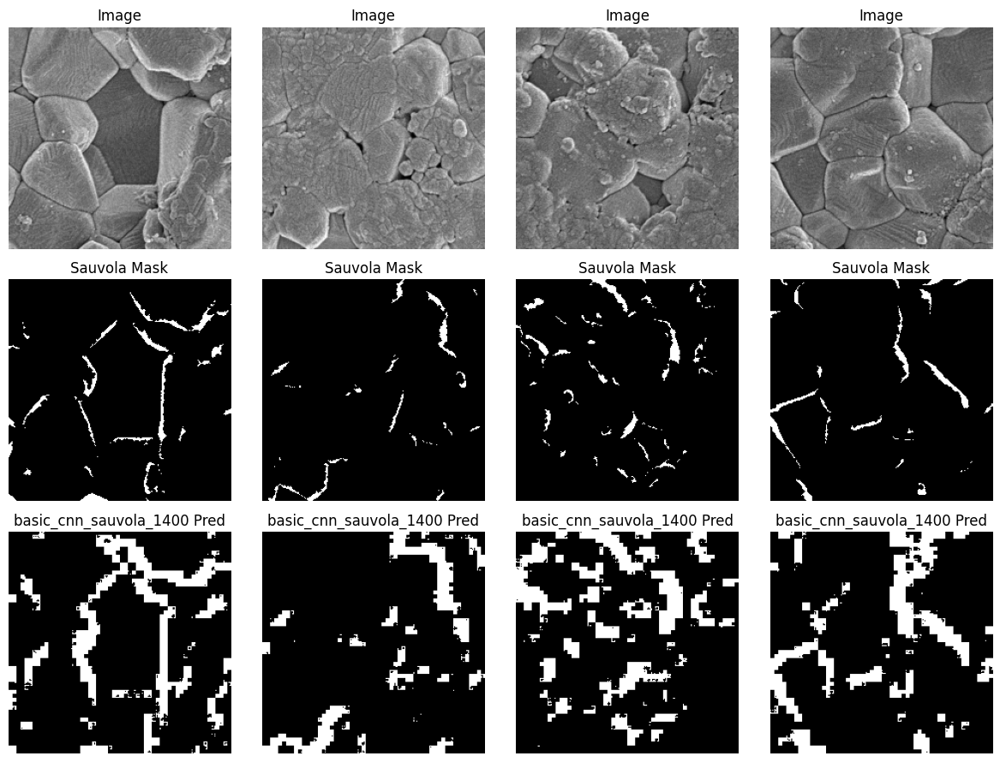

basic_cnn_sauvola_1400 | Epoch 15/20 | Train Loss: 0.4977 | Val Loss: 0.4628
Saved best basic_cnn_sauvola_1400
basic_cnn_sauvola_1400 | Epoch 16/20 | Train Loss: 0.4942 | Val Loss: 0.4754


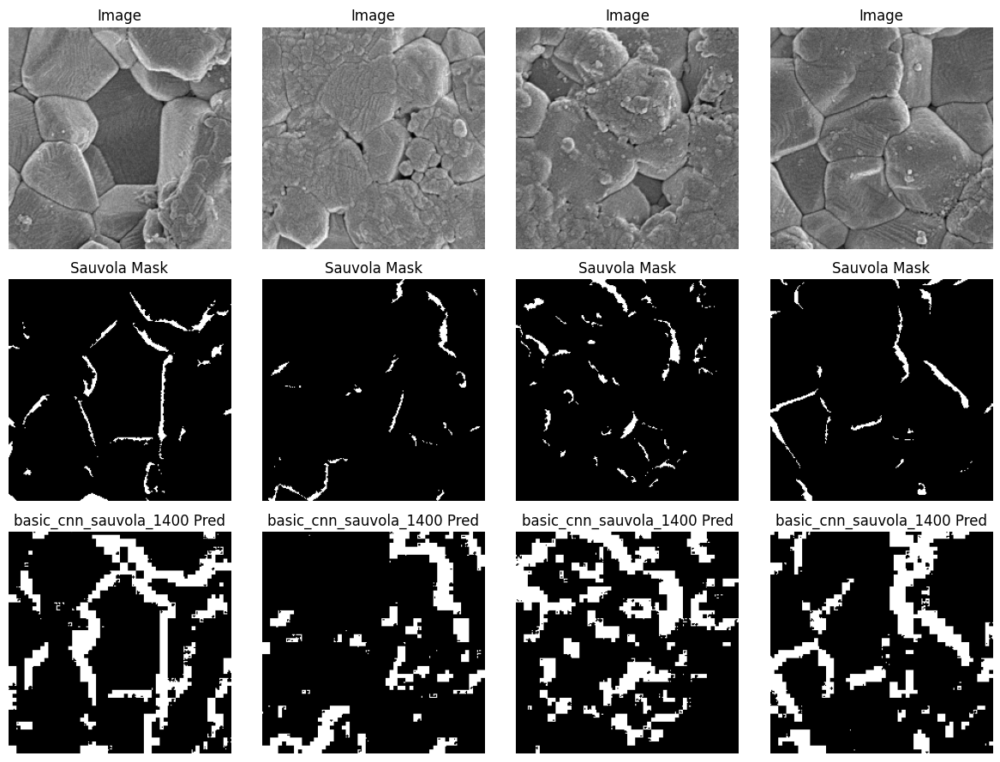

basic_cnn_sauvola_1400 | Epoch 17/20 | Train Loss: 0.5014 | Val Loss: 0.4494
Saved best basic_cnn_sauvola_1400
basic_cnn_sauvola_1400 | Epoch 18/20 | Train Loss: 0.4877 | Val Loss: 0.4644


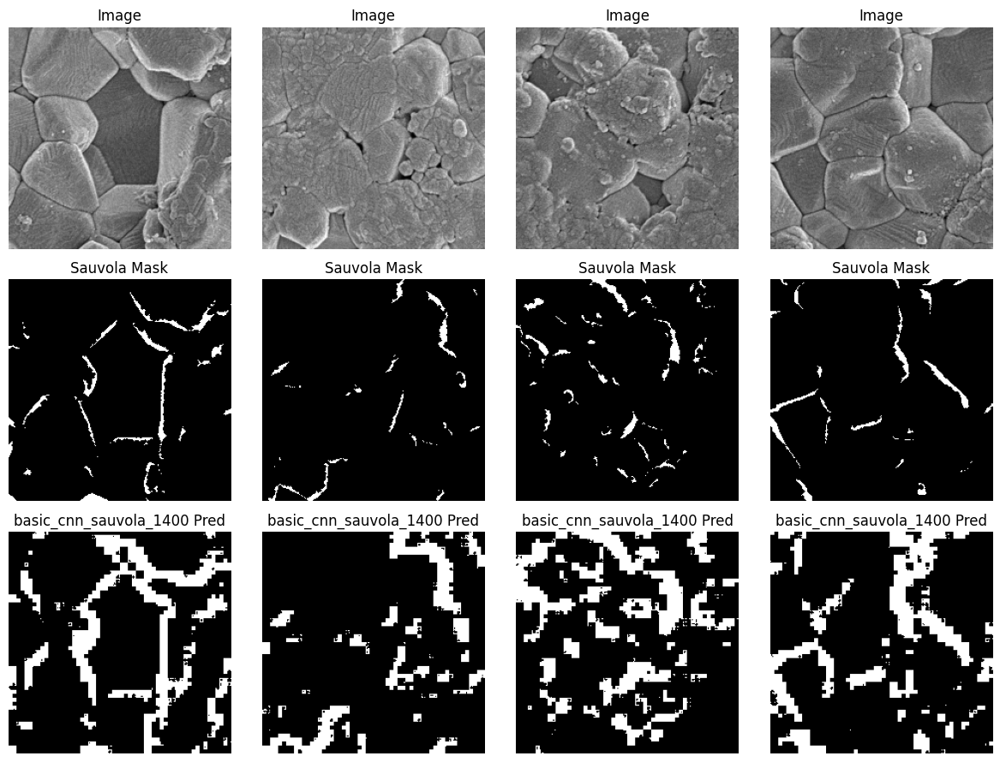

basic_cnn_sauvola_1400 | Epoch 19/20 | Train Loss: 0.4756 | Val Loss: 0.4498
basic_cnn_sauvola_1400 | Epoch 20/20 | Train Loss: 0.4669 | Val Loss: 0.4327
Saved best basic_cnn_sauvola_1400


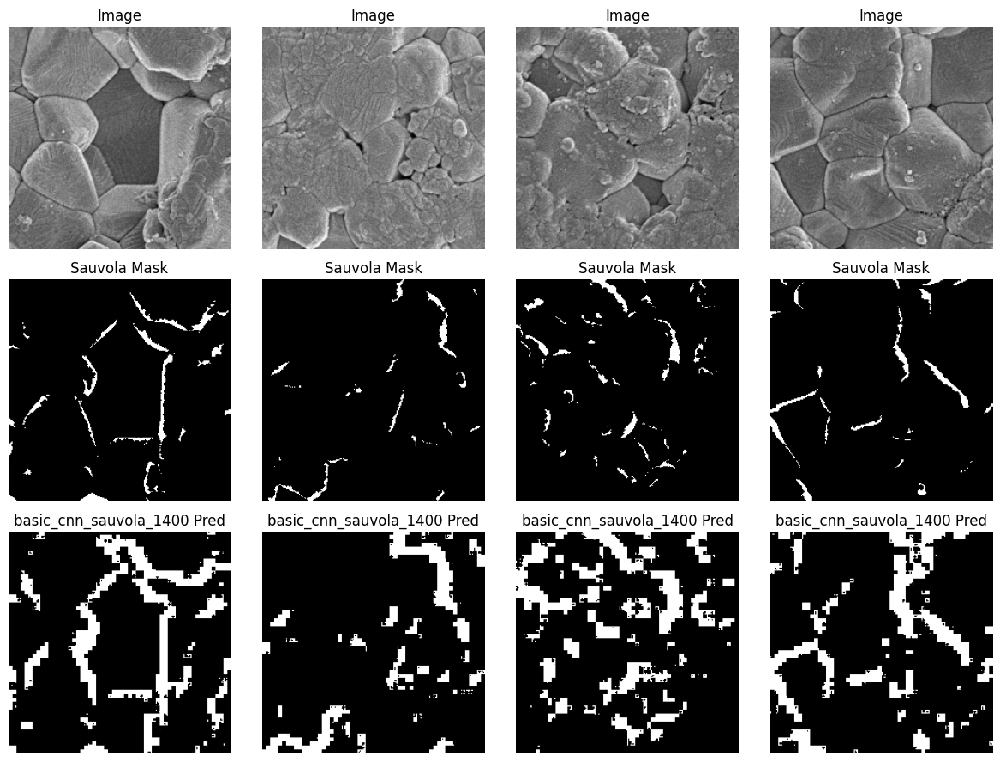

In [40]:

#Train Models Separately

cnn_model = BasicSegCNN()
cnn_model, cnn_train_losses, cnn_val_losses = train_model(
    cnn_model,
    train_loader,
    val_loader,
    device,
    model_name="basic_cnn_sauvola_1400",
    epochs=20
)


unet_sauvola_1400 foreground percentage: 0.04270218685269356
unet_sauvola_1400 pos_weight: 22.418004409226697
unet_sauvola_1400 | Epoch 1/20 | Train Loss: 1.1894 | Val Loss: 0.9552
Saved best unet_sauvola_1400
unet_sauvola_1400 | Epoch 2/20 | Train Loss: 0.6220 | Val Loss: 0.3902
Saved best unet_sauvola_1400


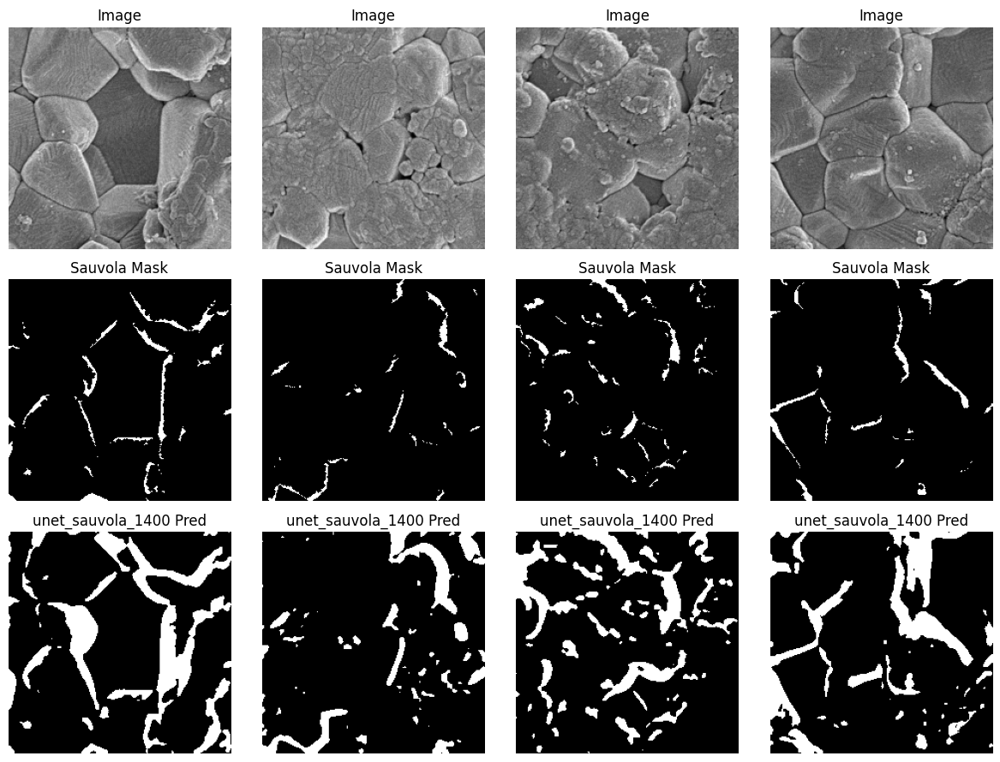

unet_sauvola_1400 | Epoch 3/20 | Train Loss: 0.3598 | Val Loss: 0.3419
Saved best unet_sauvola_1400
unet_sauvola_1400 | Epoch 4/20 | Train Loss: 0.3120 | Val Loss: 0.2442
Saved best unet_sauvola_1400


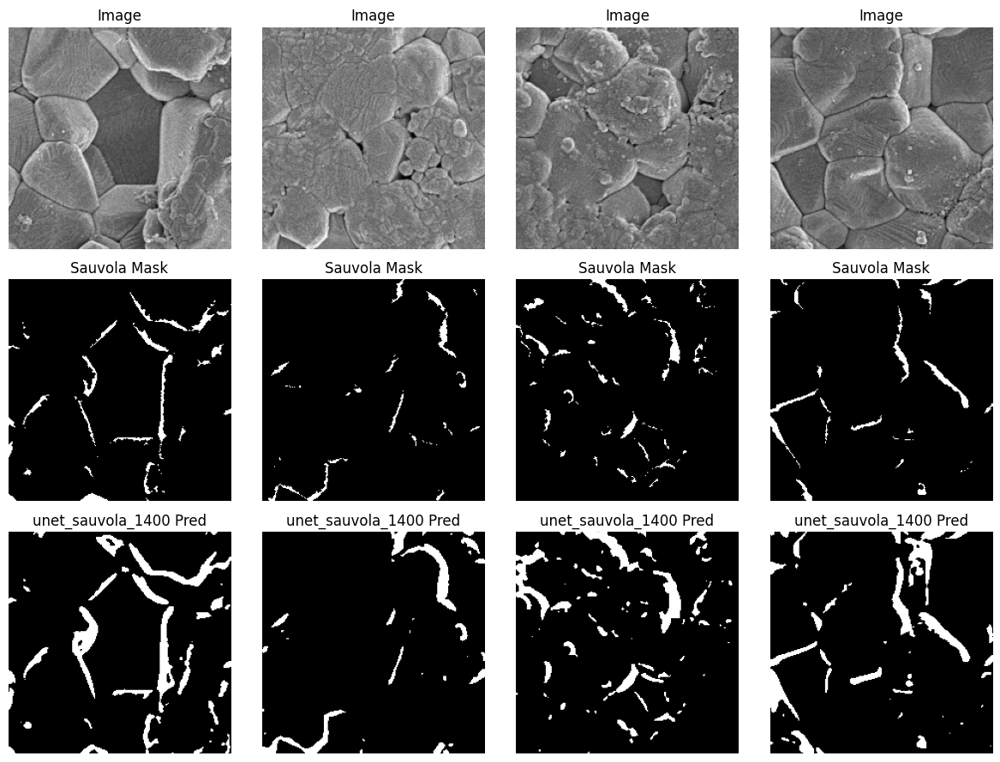

unet_sauvola_1400 | Epoch 5/20 | Train Loss: 0.2343 | Val Loss: 0.2012
Saved best unet_sauvola_1400
unet_sauvola_1400 | Epoch 6/20 | Train Loss: 0.1947 | Val Loss: 0.1801
Saved best unet_sauvola_1400


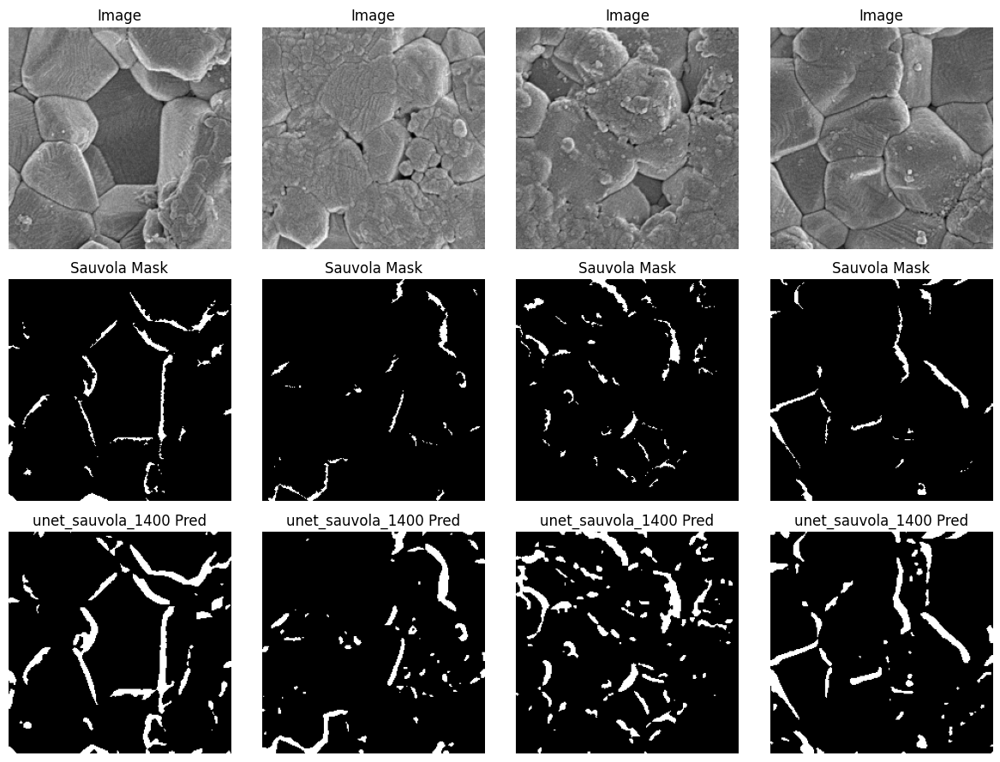

unet_sauvola_1400 | Epoch 7/20 | Train Loss: 0.1892 | Val Loss: 0.1726
Saved best unet_sauvola_1400
unet_sauvola_1400 | Epoch 8/20 | Train Loss: 0.1788 | Val Loss: 0.1746


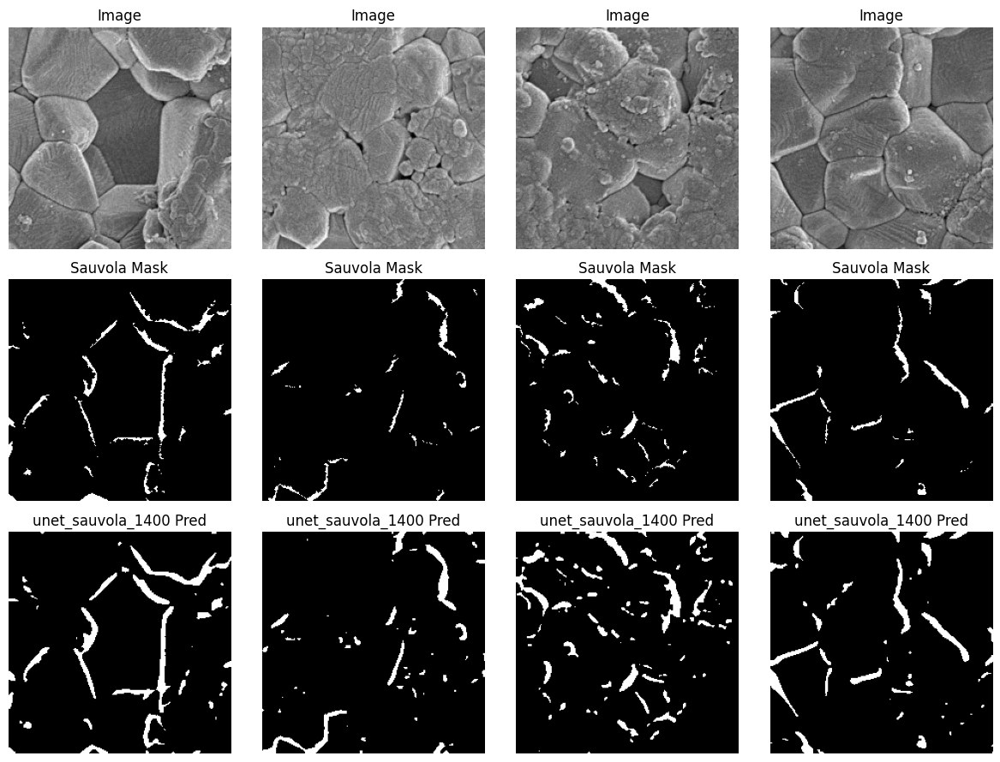

unet_sauvola_1400 | Epoch 9/20 | Train Loss: 0.1693 | Val Loss: 0.1600
Saved best unet_sauvola_1400
unet_sauvola_1400 | Epoch 10/20 | Train Loss: 0.1694 | Val Loss: 0.1627


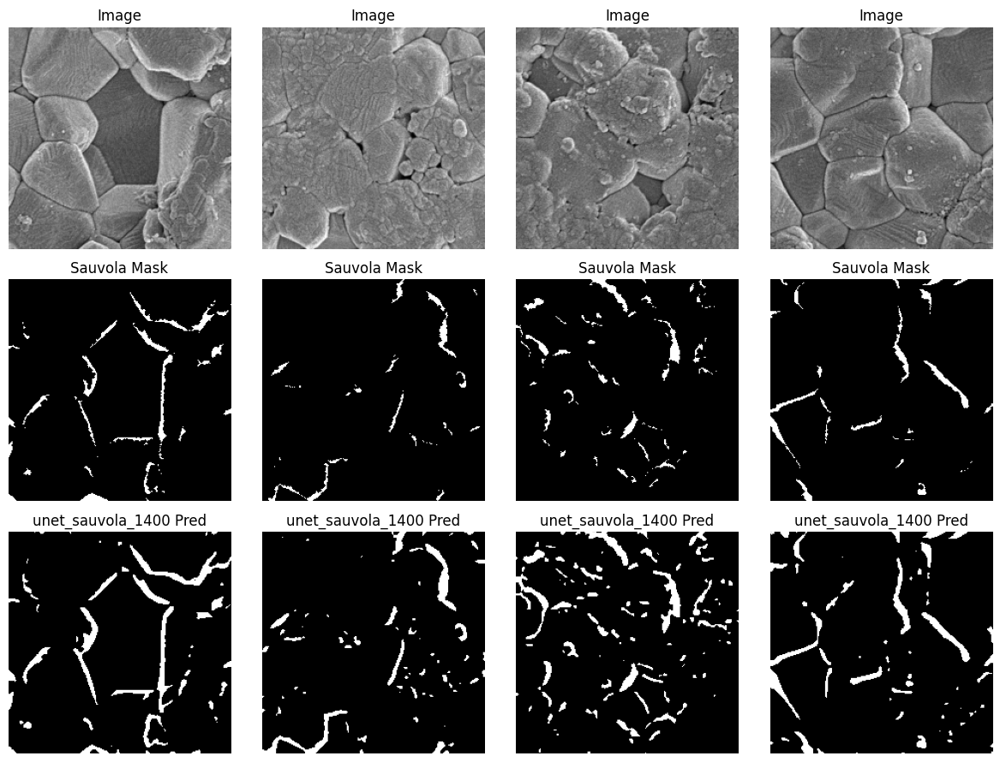

unet_sauvola_1400 | Epoch 11/20 | Train Loss: 0.1565 | Val Loss: 0.1516
Saved best unet_sauvola_1400
unet_sauvola_1400 | Epoch 12/20 | Train Loss: 0.1612 | Val Loss: 0.1506
Saved best unet_sauvola_1400


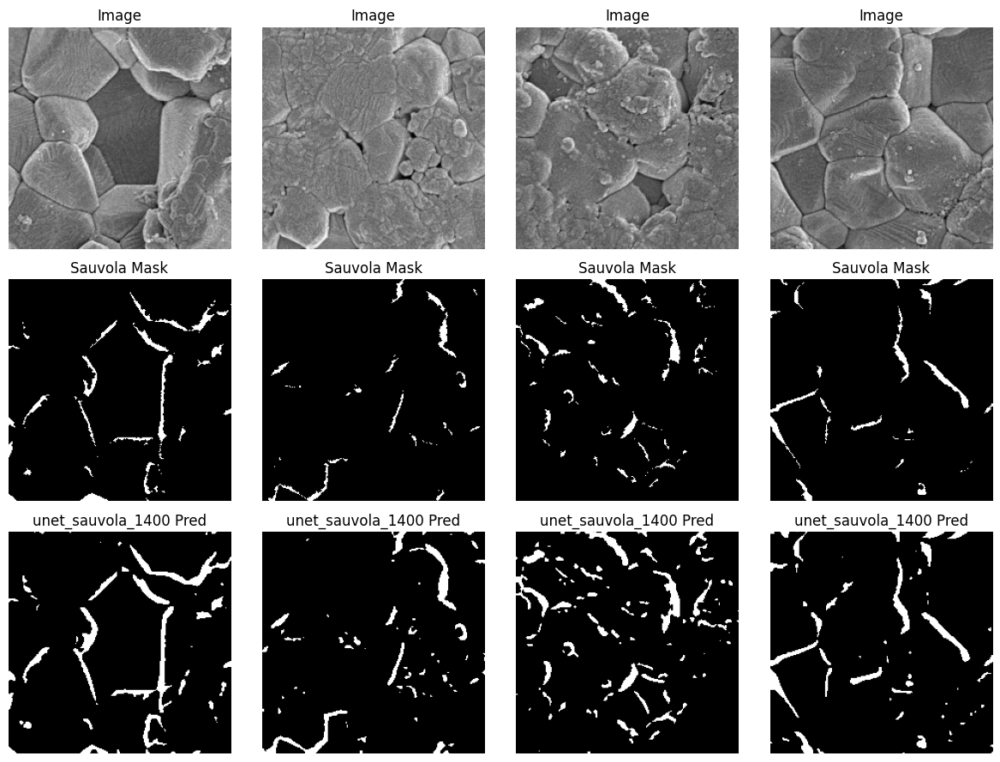

unet_sauvola_1400 | Epoch 13/20 | Train Loss: 0.1516 | Val Loss: 0.1565
unet_sauvola_1400 | Epoch 14/20 | Train Loss: 0.1753 | Val Loss: 0.1902


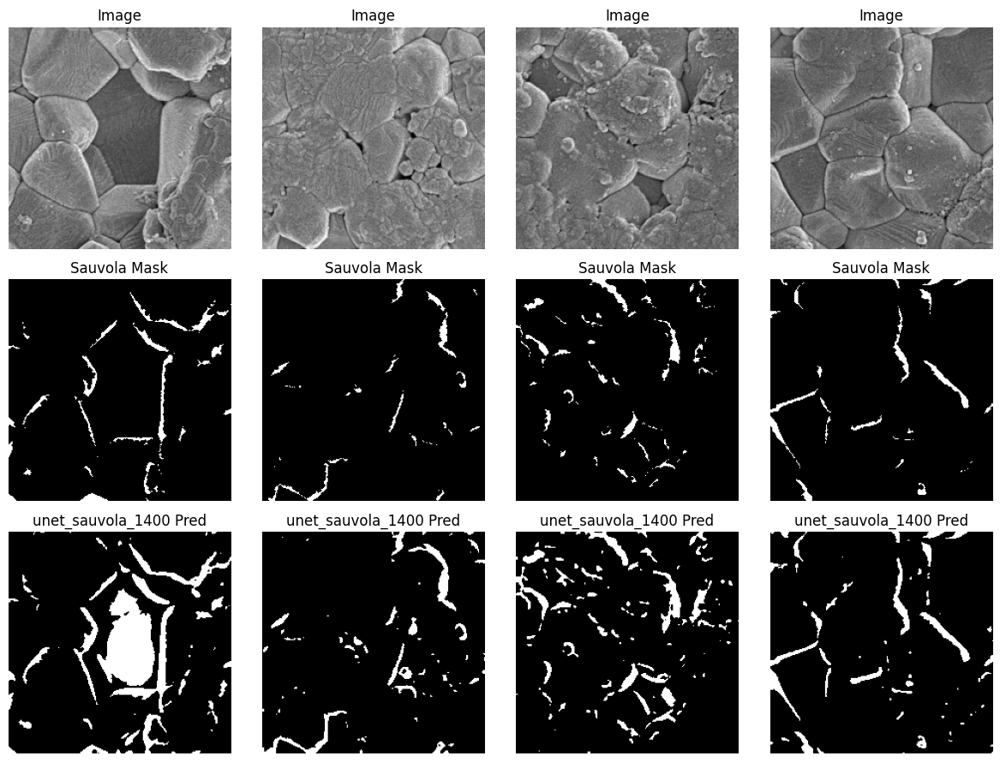

unet_sauvola_1400 | Epoch 15/20 | Train Loss: 0.1640 | Val Loss: 0.1461
Saved best unet_sauvola_1400
unet_sauvola_1400 | Epoch 16/20 | Train Loss: 0.1489 | Val Loss: 0.1420
Saved best unet_sauvola_1400


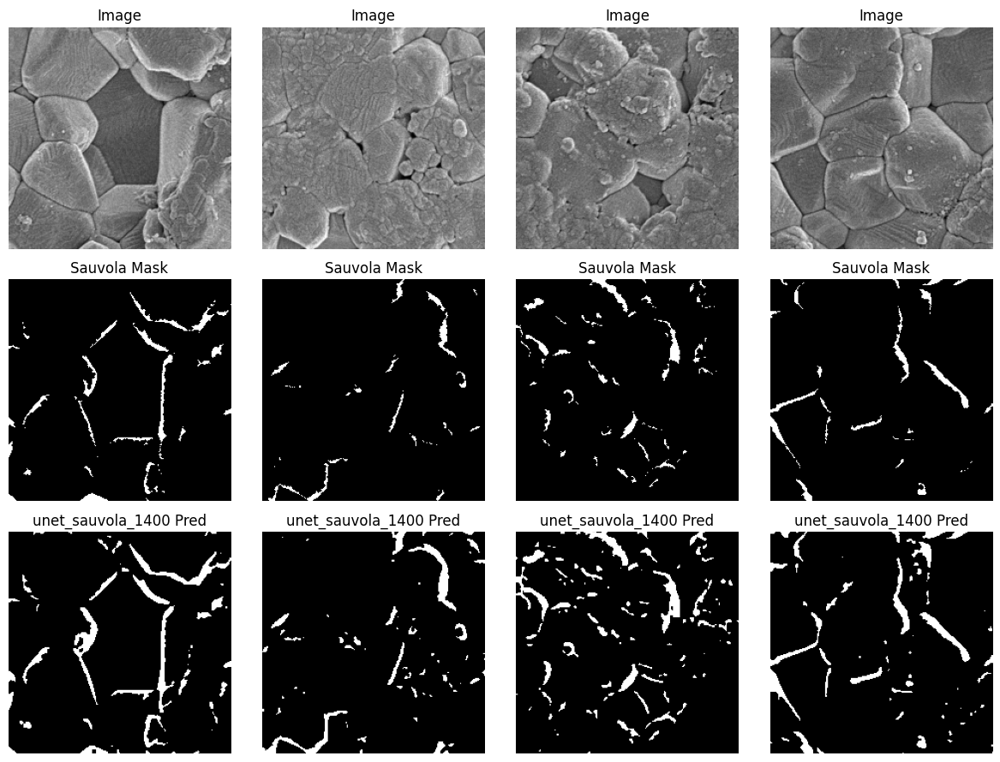

unet_sauvola_1400 | Epoch 17/20 | Train Loss: 0.1418 | Val Loss: 0.1499
unet_sauvola_1400 | Epoch 18/20 | Train Loss: 0.1423 | Val Loss: 0.1356
Saved best unet_sauvola_1400


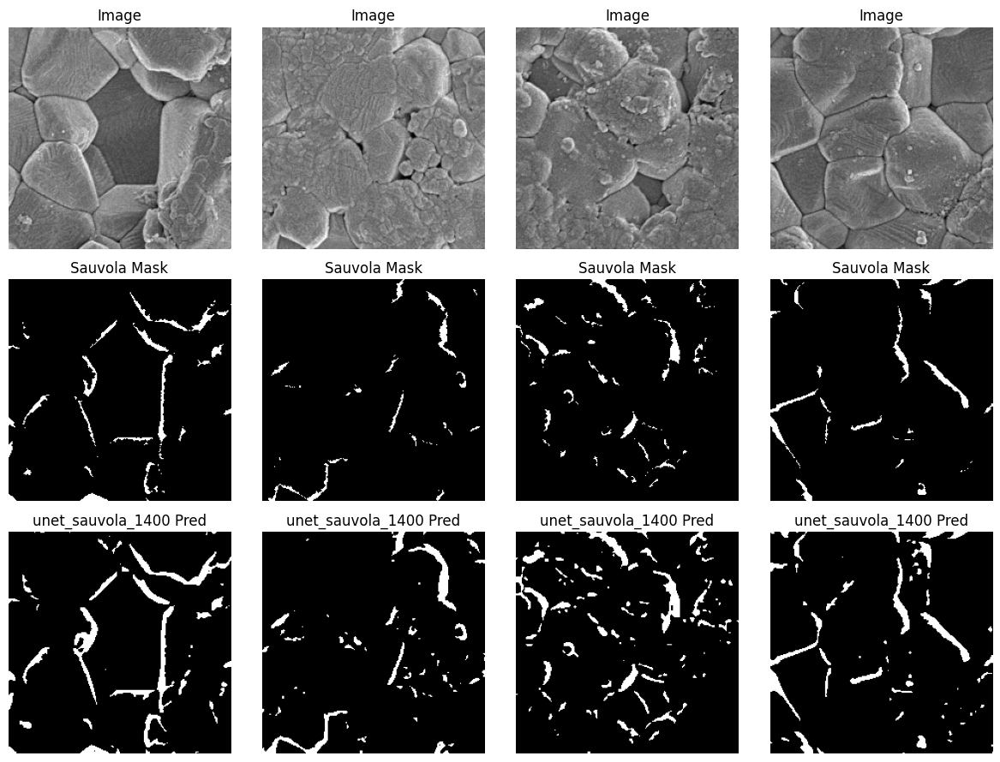

unet_sauvola_1400 | Epoch 19/20 | Train Loss: 0.1327 | Val Loss: 0.1420
unet_sauvola_1400 | Epoch 20/20 | Train Loss: 0.1250 | Val Loss: 0.1474


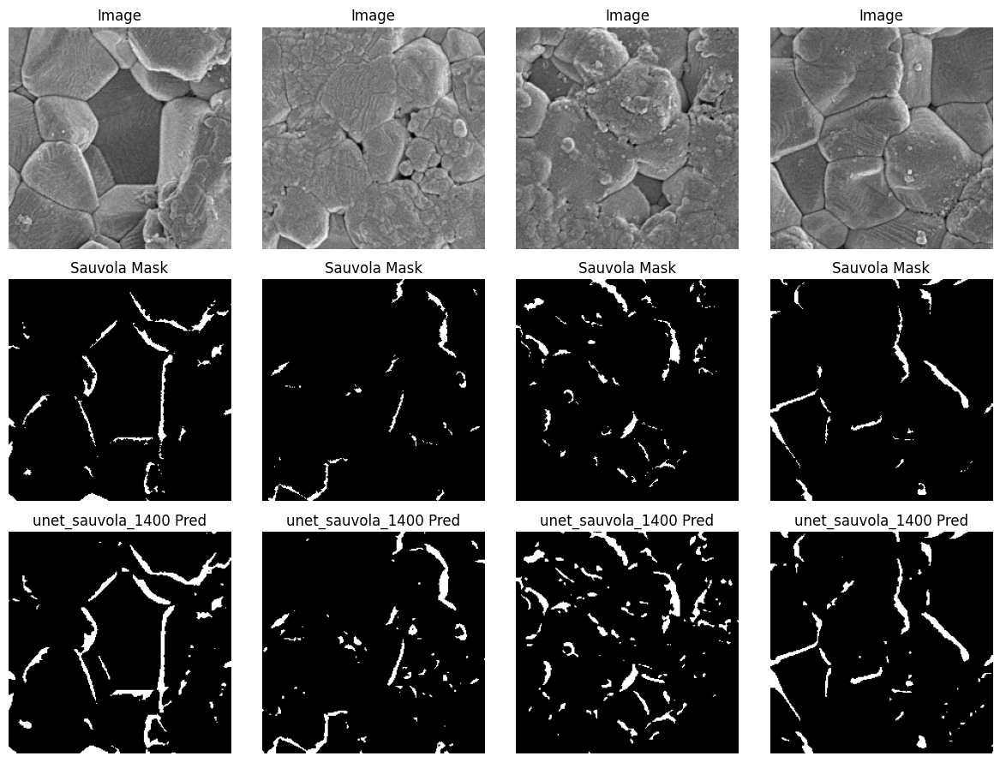

In [41]:
unet_model = UNetSmall()
unet_model, unet_train_losses, unet_val_losses = train_model(
    unet_model,
    train_loader,
    val_loader,
    device,
    model_name="unet_sauvola_1400",
    epochs=20
)


dinov2_decoder_sauvola_1400 foreground percentage: 0.031103016808629036
dinov2_decoder_sauvola_1400 pos_weight: 31.151222055172667
dinov2_decoder_sauvola_1400 | Epoch 1/20 | Train Loss: 1.5231 | Val Loss: 1.4799
Saved best dinov2_decoder_sauvola_1400
dinov2_decoder_sauvola_1400 | Epoch 2/20 | Train Loss: 1.4890 | Val Loss: 1.4750
Saved best dinov2_decoder_sauvola_1400


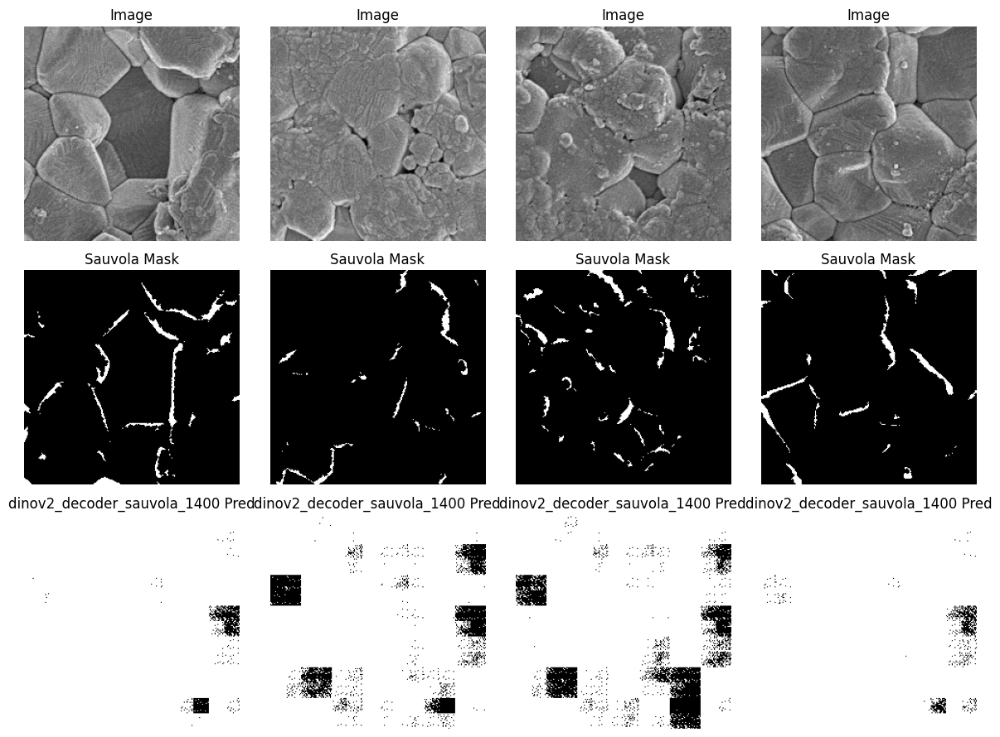

dinov2_decoder_sauvola_1400 | Epoch 3/20 | Train Loss: 1.4701 | Val Loss: 1.4743
Saved best dinov2_decoder_sauvola_1400
dinov2_decoder_sauvola_1400 | Epoch 4/20 | Train Loss: 1.4528 | Val Loss: 1.4716
Saved best dinov2_decoder_sauvola_1400


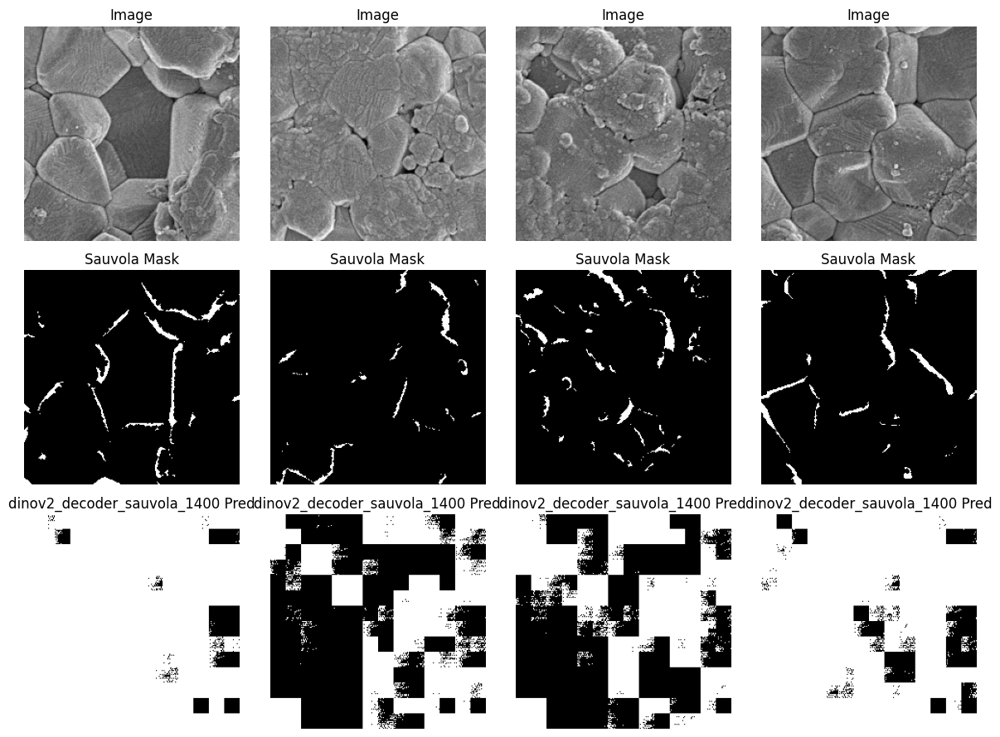

dinov2_decoder_sauvola_1400 | Epoch 5/20 | Train Loss: 1.4359 | Val Loss: 1.4768
dinov2_decoder_sauvola_1400 | Epoch 6/20 | Train Loss: 1.4198 | Val Loss: 1.4949


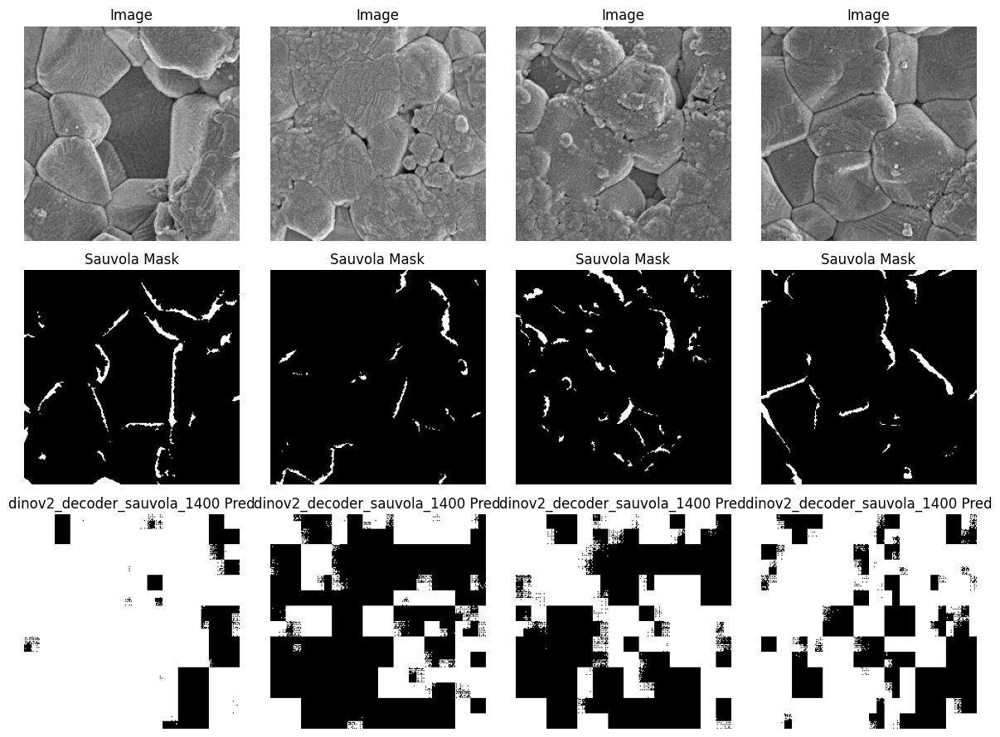

dinov2_decoder_sauvola_1400 | Epoch 7/20 | Train Loss: 1.3946 | Val Loss: 1.4846
dinov2_decoder_sauvola_1400 | Epoch 8/20 | Train Loss: 1.3666 | Val Loss: 1.5072


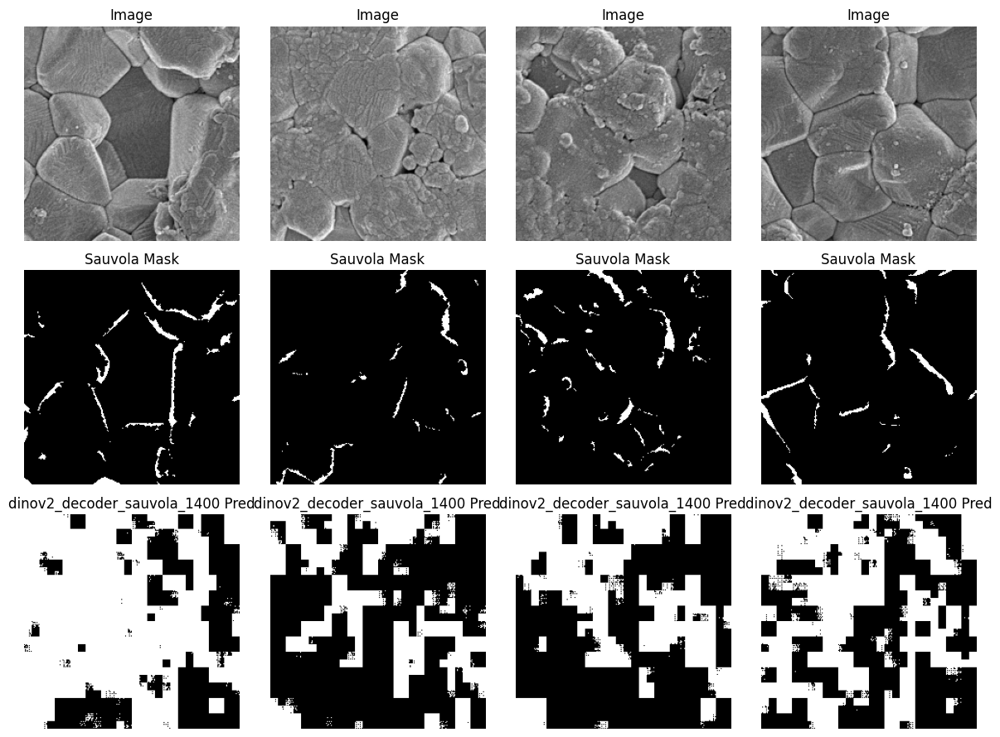

dinov2_decoder_sauvola_1400 | Epoch 9/20 | Train Loss: 1.3340 | Val Loss: 1.5129
dinov2_decoder_sauvola_1400 | Epoch 10/20 | Train Loss: 1.3027 | Val Loss: 1.5181


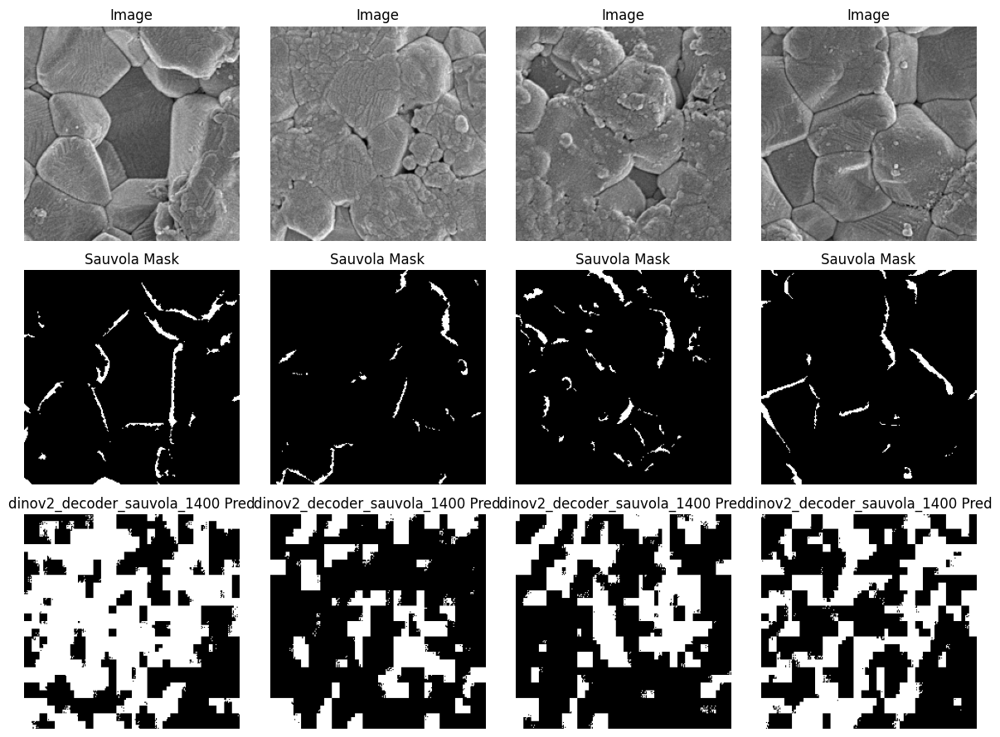

dinov2_decoder_sauvola_1400 | Epoch 11/20 | Train Loss: 1.2604 | Val Loss: 1.5237
dinov2_decoder_sauvola_1400 | Epoch 12/20 | Train Loss: 1.2267 | Val Loss: 1.5610


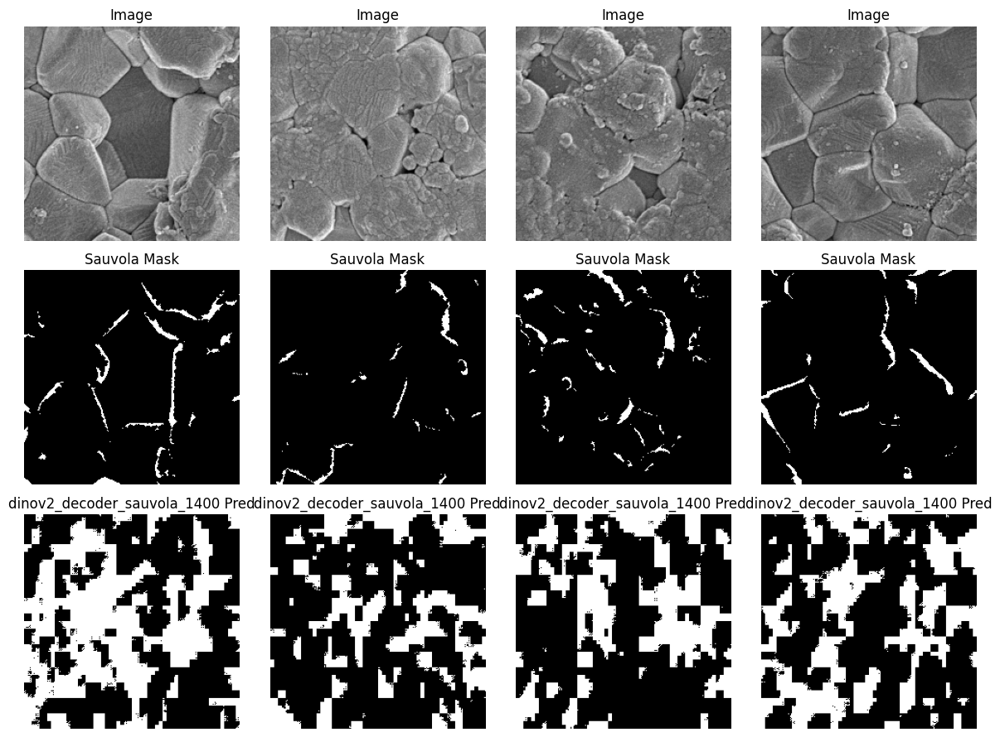

dinov2_decoder_sauvola_1400 | Epoch 13/20 | Train Loss: 1.1825 | Val Loss: 1.5876
dinov2_decoder_sauvola_1400 | Epoch 14/20 | Train Loss: 1.1330 | Val Loss: 1.6474


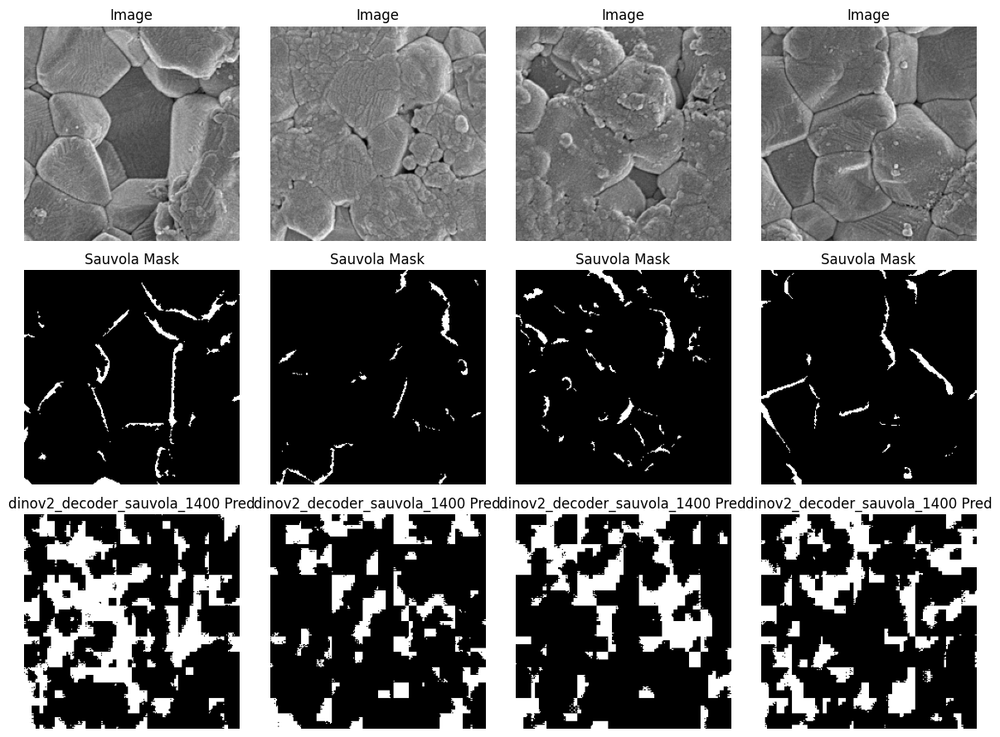

dinov2_decoder_sauvola_1400 | Epoch 15/20 | Train Loss: 1.0913 | Val Loss: 1.7400
dinov2_decoder_sauvola_1400 | Epoch 16/20 | Train Loss: 1.0476 | Val Loss: 1.8308


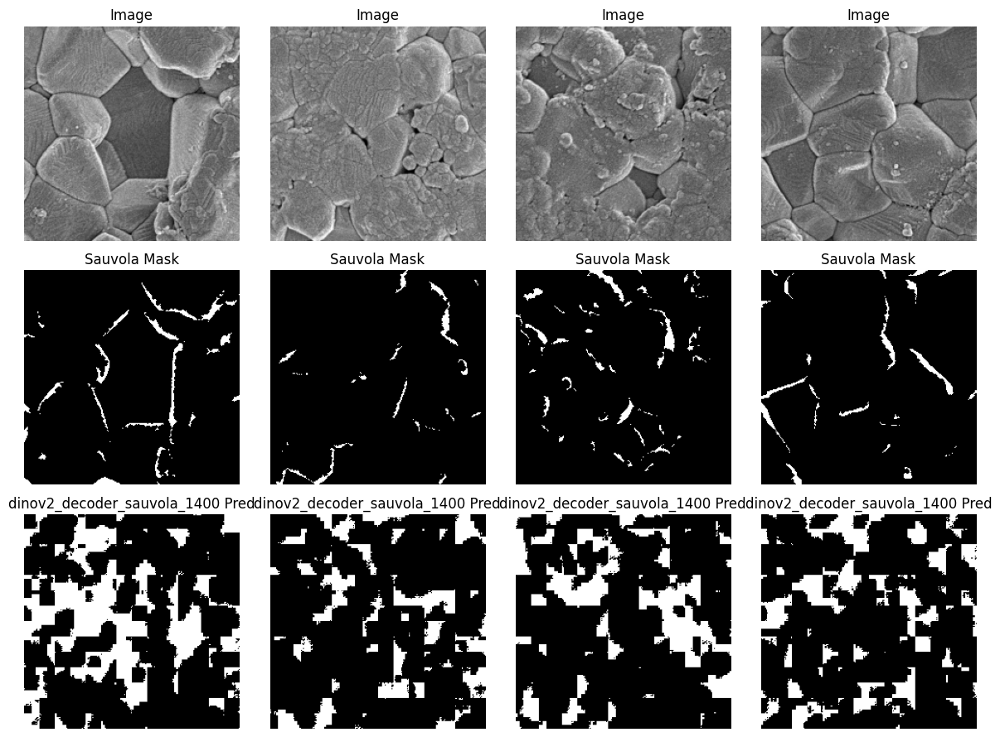

dinov2_decoder_sauvola_1400 | Epoch 17/20 | Train Loss: 1.0017 | Val Loss: 1.9189
dinov2_decoder_sauvola_1400 | Epoch 18/20 | Train Loss: 0.9594 | Val Loss: 2.0469


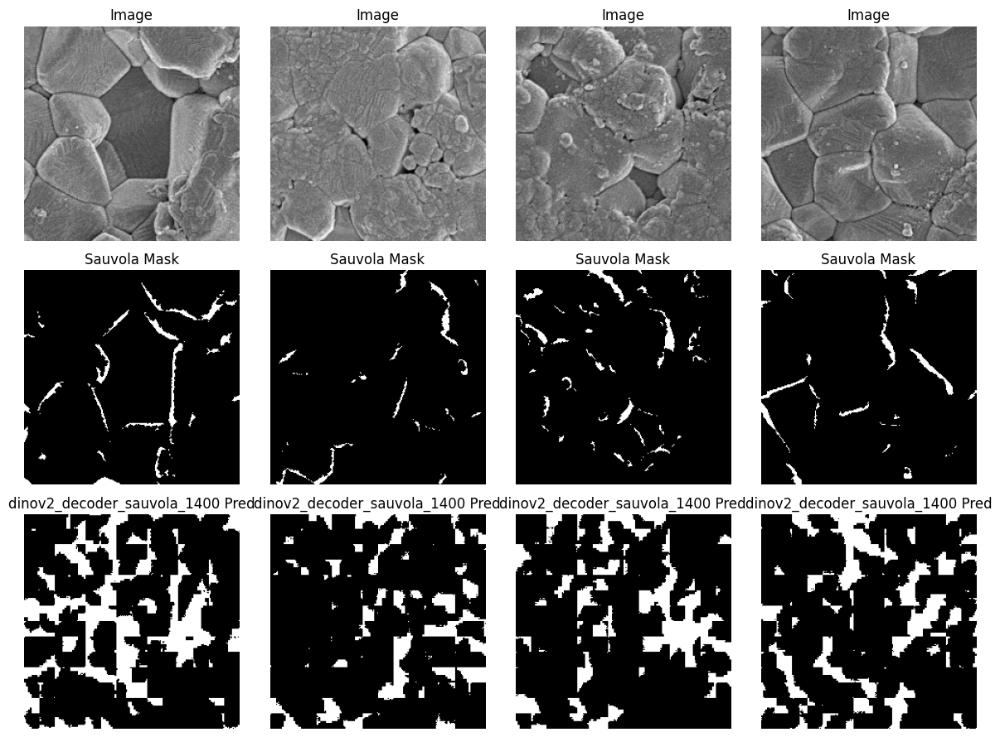

dinov2_decoder_sauvola_1400 | Epoch 19/20 | Train Loss: 0.9077 | Val Loss: 2.1229
dinov2_decoder_sauvola_1400 | Epoch 20/20 | Train Loss: 0.8598 | Val Loss: 2.1485


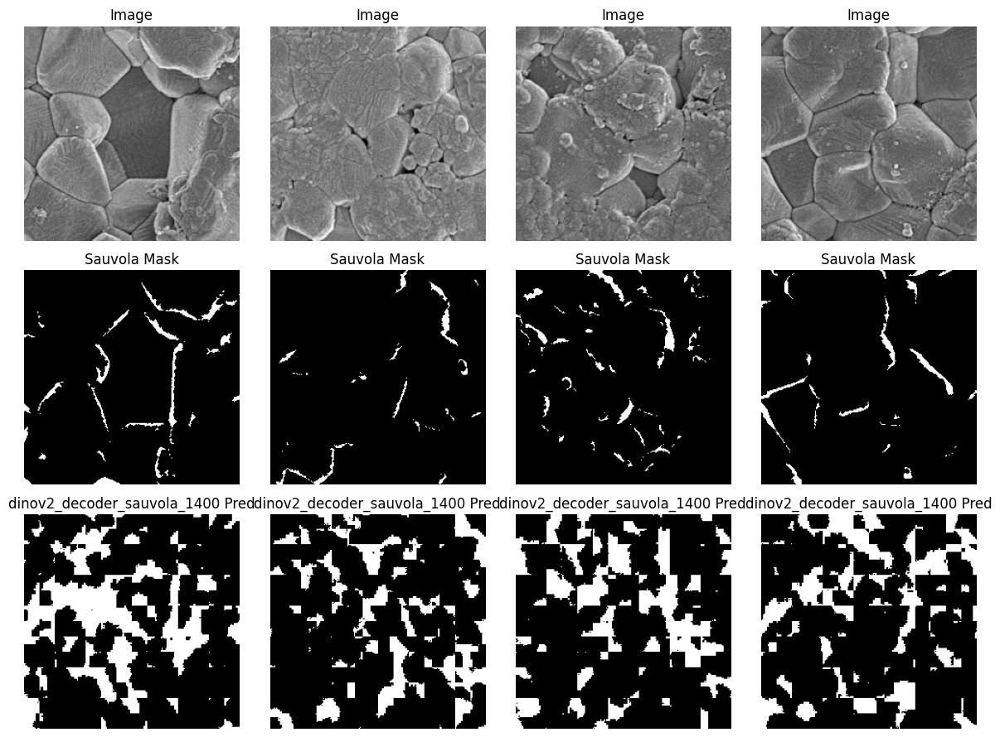

In [42]:
dinov2_model = DINOv2SegmentationModel(dino_model=dino)
dinov2_model, dinov2_train_losses, dinov2_val_losses = train_model(
    dinov2_model,
    train_loader,
    val_loader,
    device,
    model_name="dinov2_decoder_sauvola_1400",
    epochs=20
)

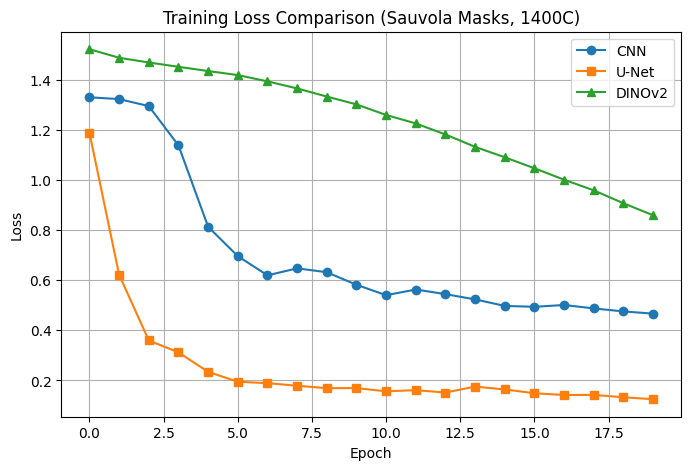

In [53]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))

plt.plot(cnn_train_losses, marker="o", label="CNN")
plt.plot(unet_train_losses, marker="s", label="U-Net")
plt.plot(dinov2_train_losses, marker="^", label="DINOv2")

plt.title("Training Loss Comparison (Sauvola Masks, 1400C)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

plt.show()

In [43]:
#evaluation metrics
def get_predictions(model, loader, device):
    model.eval()# set model to evaluation mode (disables dropout, batchnorm updates)
    
    all_preds = [] #to store predicted masks
    all_masks = [] #to store ground truth masks

    with torch.no_grad():
        for images, masks in loader:
            images = images.to(device) # move data to GPU/CPU

            masks = masks.to(device)

            logits = model(images) # forward pass → raw outputs (logits)
            probs = torch.sigmoid(logits) # convert logits → probabilities (0 to 1)

            preds = (probs > 0.5).float() # convert probabilities -> binary mask (threshold at 0.5)

            all_preds.append(preds.cpu())
            all_masks.append(masks.cpu())

    return torch.cat(all_preds), torch.cat(all_masks)   # combine all batches into one tensor

In [44]:
def dice_score(pred, target, eps=1e-6):
    intersection = (pred * target).sum() # intersection = common pixels between prediction and ground truth
    return (2. * intersection) / (pred.sum() + target.sum() + eps) # 2 * intersection / (total predicted + total ground truth)
#eps is added to avoid division by zero

def iou_score(pred, target, eps=1e-6):
    intersection = (pred * target).sum() # intersection = overlap
    union = pred.sum() + target.sum() - intersection # union = total area covered by either pred or target
    return intersection / (union + eps) # IoU = intersection / union


def pixel_accuracy(pred, target): # count how many pixels are exactly the same
    correct = (pred == target).float().sum()
    total = torch.numel(pred) # total number of pixels
    return correct / total

In [45]:
def evaluate_model(model, loader, device):
    preds, masks = get_predictions(model, loader, device) # get all predictions and ground truth masks

    dice = dice_score(preds, masks).item()
    iou = iou_score(preds, masks).item()
    acc = pixel_accuracy(preds, masks).item()

    print(f"Dice Score: {dice:.4f}")
    print(f"IoU Score: {iou:.4f}")
    print(f"Pixel Accuracy: {acc:.4f}")

    return dice, iou, acc

In [49]:
print("=== CNN ===")
cnn_metrics = evaluate_model(cnn_model, val_loader, device)

print("\n=== U-Net ===")
unet_metrics = evaluate_model(unet_model, val_loader, device)

print("\n=== DINOv2 ===")
dino_metrics = evaluate_model(dinov2_model, val_loader, device)

=== CNN ===
Dice Score: 0.3631
IoU Score: 0.2219
Pixel Accuracy: 0.8761

=== U-Net ===
Dice Score: 0.7139
IoU Score: 0.5551
Pixel Accuracy: 0.9712

=== DINOv2 ===
Dice Score: 0.0724
IoU Score: 0.0375
Pixel Accuracy: 0.7429


In [52]:
print("Epochs=20, Sauvola")
print("Model      Dice      IoU       Accuracy")
print(f"CNN        {cnn_metrics[0]:.4f}    {cnn_metrics[1]:.4f}    {cnn_metrics[2]:.4f}")
print(f"U-Net      {unet_metrics[0]:.4f}    {unet_metrics[1]:.4f}    {unet_metrics[2]:.4f}")
print(f"DINOv2     {dino_metrics[0]:.4f}    {dino_metrics[1]:.4f}    {dino_metrics[2]:.4f}")

Epochs=20, Sauvola
Model      Dice      IoU       Accuracy
CNN        0.3631    0.2219    0.8761
U-Net      0.7139    0.5551    0.9712
DINOv2     0.0724    0.0375    0.7429
